## Installation

TFDS exists in two packages:

* `pip install tensorflow-datasets`: The stable version, released every few months.
* `pip install tfds-nightly`: Released every day, contains the last versions of the datasets.

This colab uses `tfds-nightly`:


In [ ]:
!pip install -q tfds-nightly tensorflow matplotlib Pillow

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
from PIL import Image
import os
import json

## Load a dataset

Use `tfds.load`. It will:

1. Download the data and save it as [`tfrecord`](https://www.tensorflow.org/tutorials/load_data/tfrecord) files.
2. Load the `tfrecord` and create the `tf.data.Dataset`.


In [ ]:
# to find available datasets, please remove the comments symbols for line 2
# tfds.list_builders()

root_dir = "/content/"

ds = tfds.load('places365_small', split='train', shuffle_files=True,
               data_dir=root_dir)
assert isinstance(ds, tf.data.Dataset)
print(ds)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/1803460 [00:00<?, ? examples/s]

Shuffling /content/places365_small/2.1.0.incomplete8SSCJW/places365_small-train.tfrecord*...:   0%|          |…

Generating test examples...:   0%|          | 0/328500 [00:00<?, ? examples/s]

Shuffling /content/places365_small/2.1.0.incomplete8SSCJW/places365_small-test.tfrecord*...:   0%|          | …

Generating validation examples...:   0%|          | 0/36500 [00:00<?, ? examples/s]

Shuffling /content/places365_small/2.1.0.incomplete8SSCJW/places365_small-validation.tfrecord*...:   0%|      …

Dataset places365_small downloaded and prepared to /content/places365_small/2.1.0. Subsequent calls will reuse this data.
<_PrefetchDataset element_spec={'filename': TensorSpec(shape=(), dtype=tf.string, name=None), 'image': TensorSpec(shape=(256, 256, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>


Some common arguments:

*   `split=`: Which split to read (e.g. `'train'`, `['train', 'test']`, `'train[80%:]'`,...). See our [split API guide](https://www.tensorflow.org/datasets/splits).
*   `shuffle_files=`: Control whether to shuffle the files between each epoch (TFDS store big datasets in multiple smaller files). The shuffle aims to avoid Bias. In some cases, the data might be sorted in a certain way, which could introduce bias into the training process. For example, if the dataset is sorted by class label and you don't shuffle it, the model might end up learning better for some classes and worse for others because of the order in which the data is presented
*   `data_dir=`: Location where the dataset is saved (
defaults to `~/tensorflow_datasets/`)
*   `with_info=True`: Returns the `tfds.core.DatasetInfo` containing dataset metadata
*   `download=False`: Disable download


## Select 50 images, rename them and record their origin name and label

data_256/e/elevator/door/00003205.jpg 129


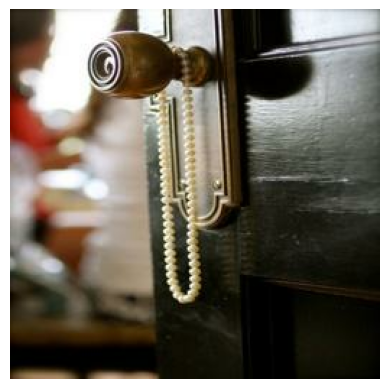

data_256/m/marsh/00003864.jpg 224


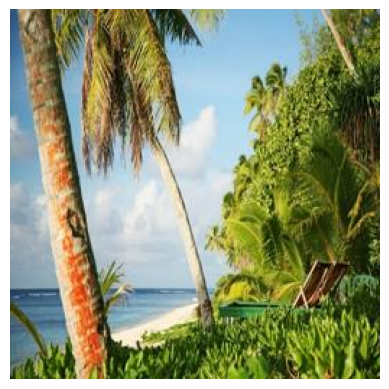

data_256/o/office_building/00001782.jpg 245


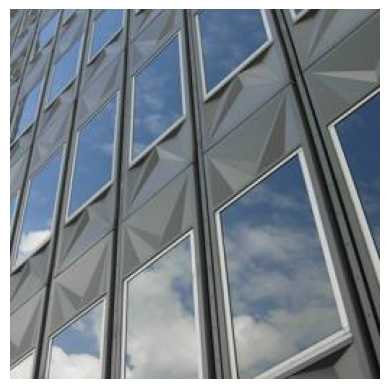

data_256/w/wheat_field/00004531.jpg 359


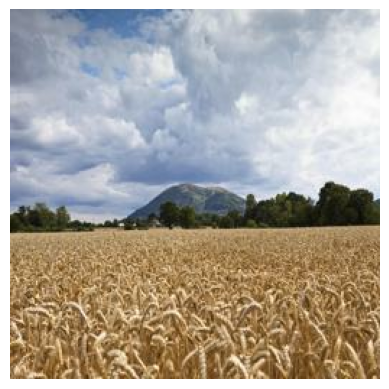

data_256/a/art_school/00001087.jpg 20


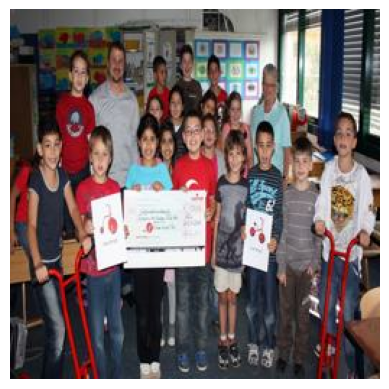

data_256/e/entrance_hall/00003888.jpg 134


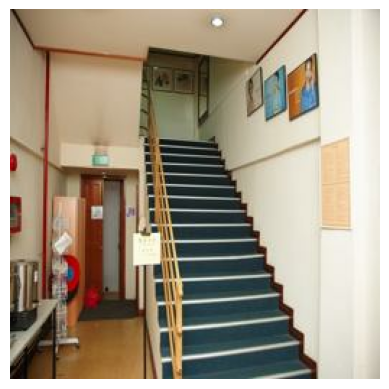

data_256/o/ocean/00000614.jpg 243


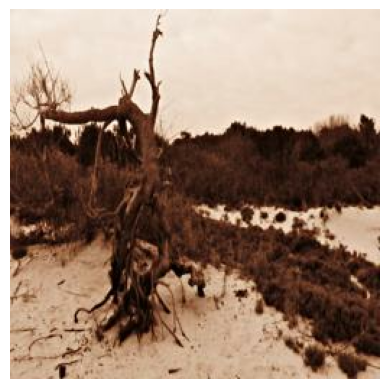

data_256/s/science_museum/00000511.jpg 297


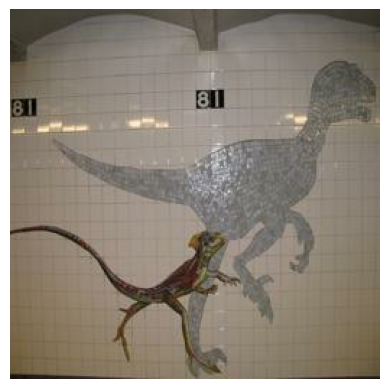

data_256/a/archive/00001825.jpg 14


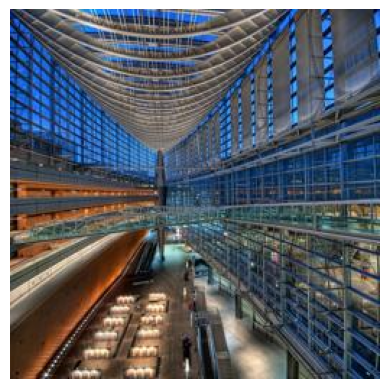

data_256/n/nursery/00004523.jpg 240


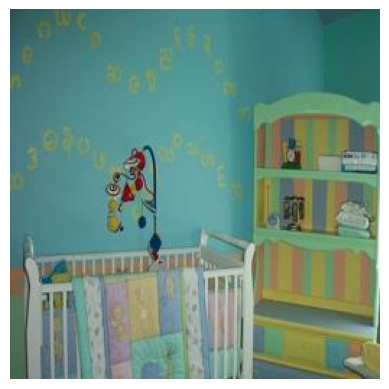

data_256/s/shower/00004513.jpg 303


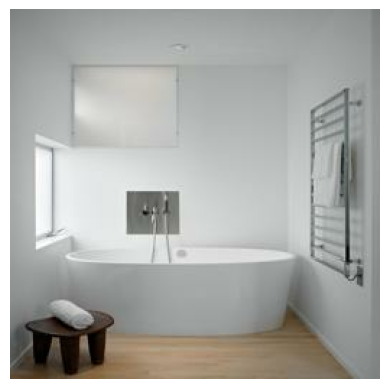

data_256/b/bedroom/00002105.jpg 52


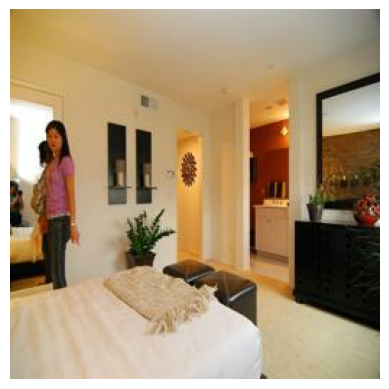

data_256/t/tree_farm/00000153.jpg 338


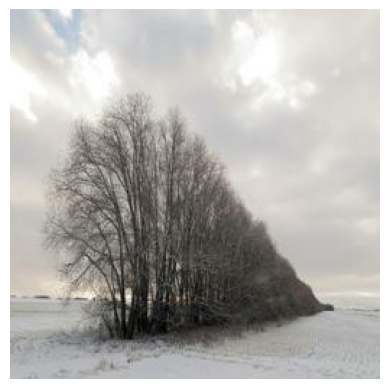

data_256/e/escalator/indoor/00003661.jpg 135


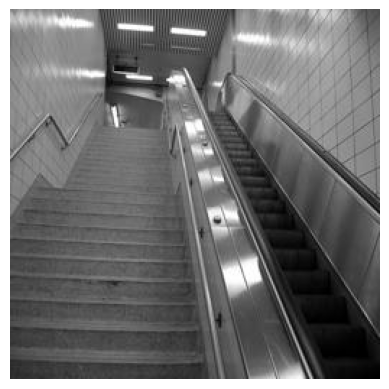

data_256/t/tower/00004547.jpg 334


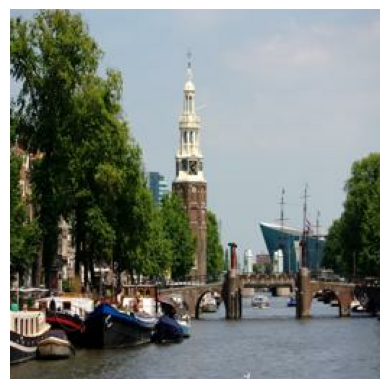

data_256/h/hangar/outdoor/00002719.jpg 170


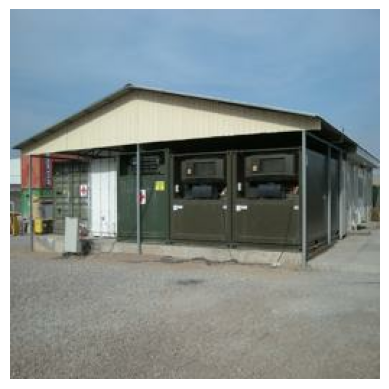

data_256/b/bedroom/00000331.jpg 52


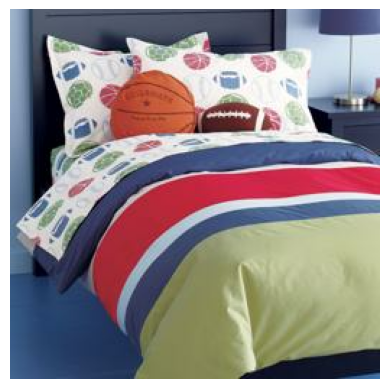

data_256/w/waterfall/00002396.jpg 355


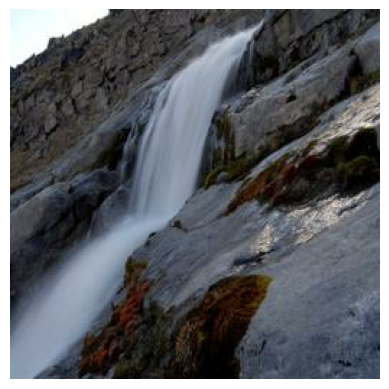

data_256/p/porch/00004068.jpg 272


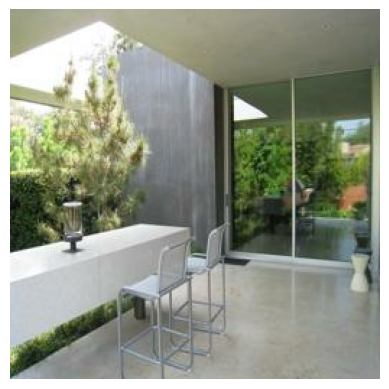

data_256/k/kennel/outdoor/00003279.jpg 201


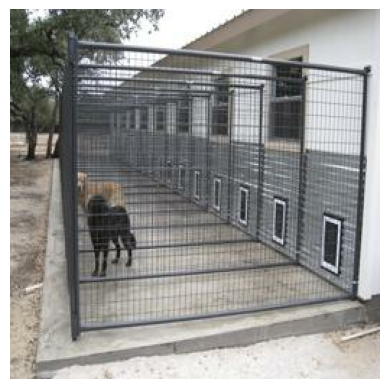

data_256/c/chalet/00002014.jpg 87


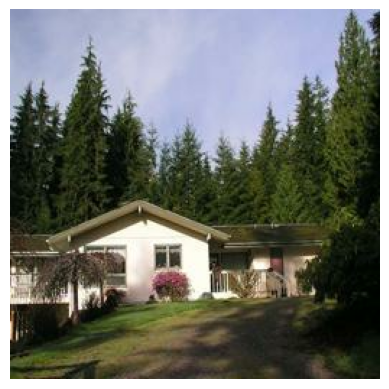

data_256/g/gift_shop/00004020.jpg 162


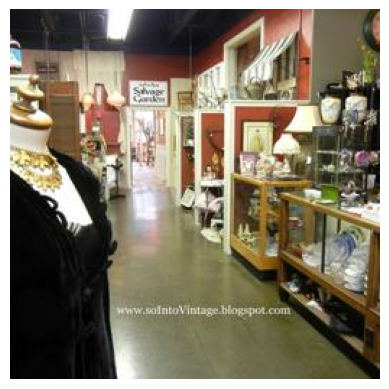

data_256/s/stadium/football/00001267.jpg 313


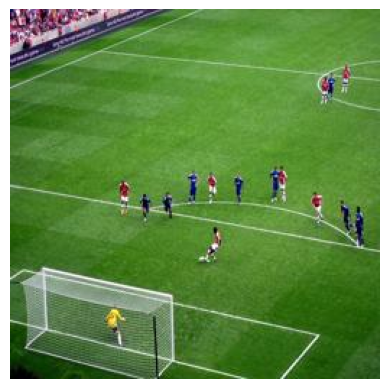

data_256/r/roof_garden/00003405.jpg 290


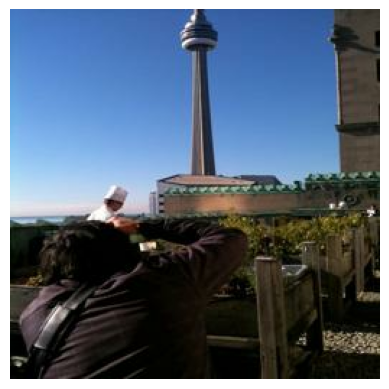

data_256/v/valley/00002038.jpg 344


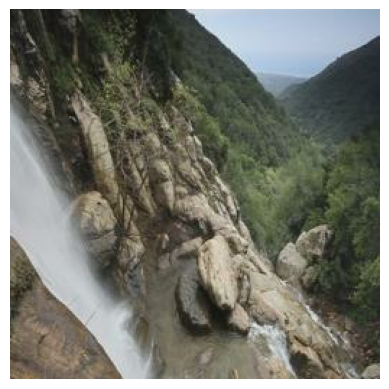

data_256/b/bowling_alley/00004061.jpg 64


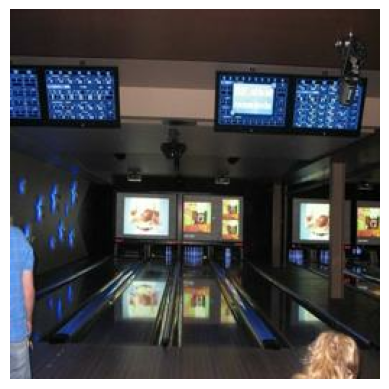

data_256/c/classroom/00001606.jpg 92


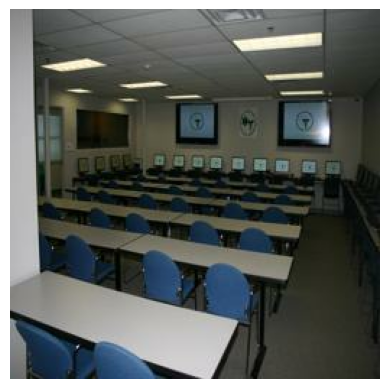

data_256/b/beer_garden/00003692.jpg 53


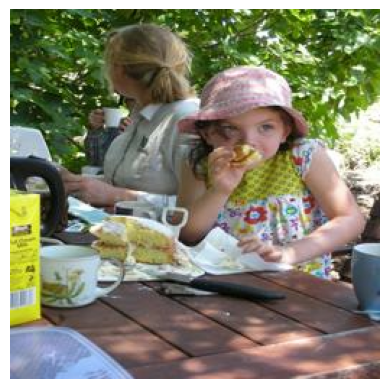

data_256/d/doorway/outdoor/00002238.jpg 123


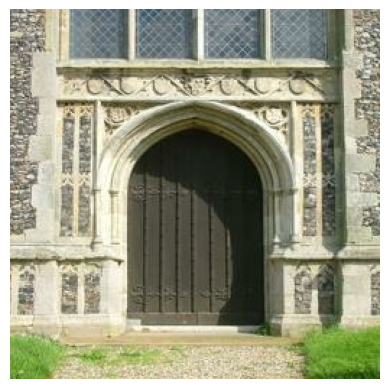

data_256/s/server_room/00003151.jpg 298


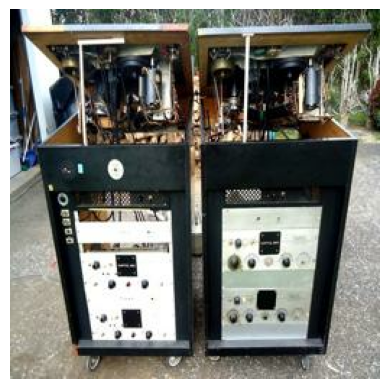

data_256/t/topiary_garden/00003274.jpg 333


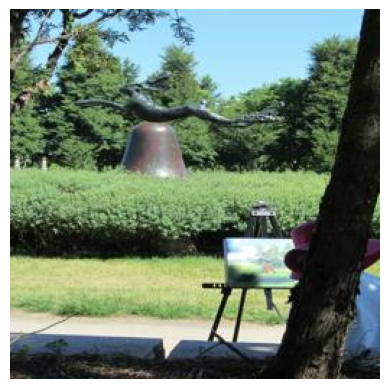

data_256/d/desert/vegetation/00000340.jpg 117


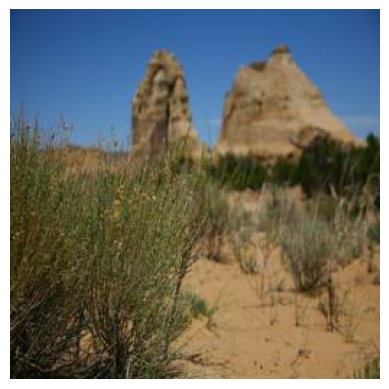

data_256/m/mezzanine/00003721.jpg 228


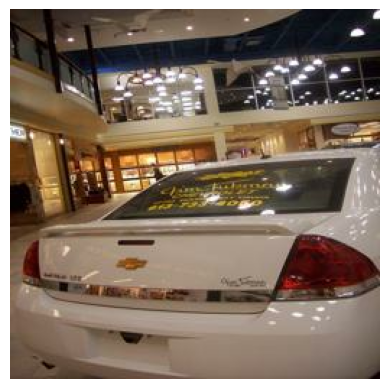

data_256/a/amusement_arcade/00003394.jpg 6


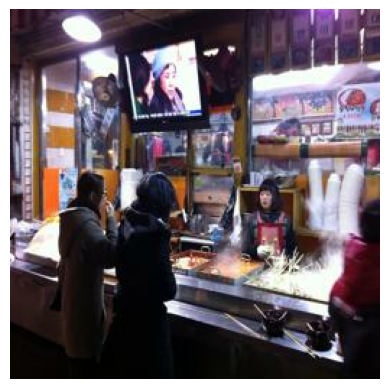

data_256/a/art_gallery/00004618.jpg 19


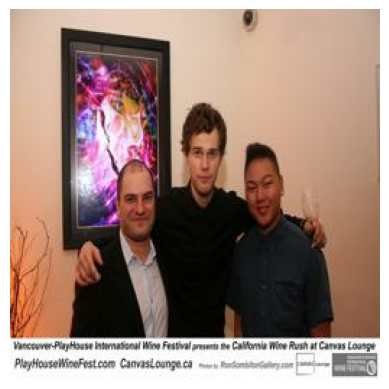

data_256/s/sandbox/00004533.jpg 294


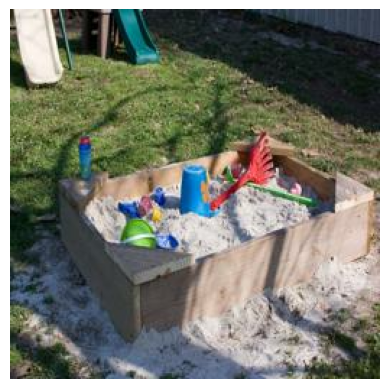

data_256/y/youth_hostel/00001666.jpg 363


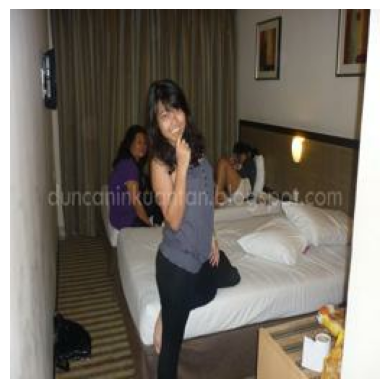

data_256/t/tree_house/00002728.jpg 339


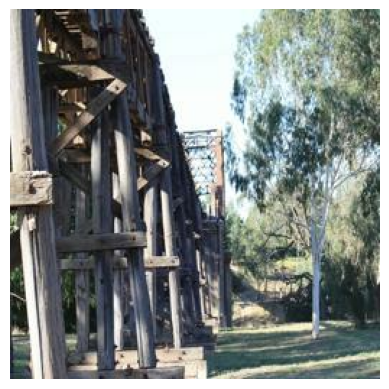

data_256/o/office/00003998.jpg 244


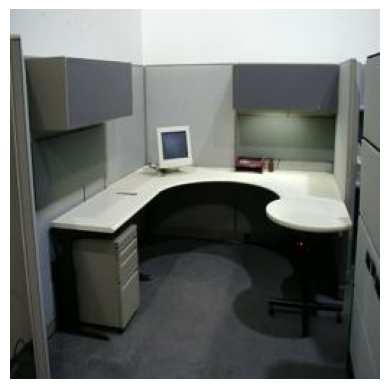

data_256/a/arena/performance/00002245.jpg 16


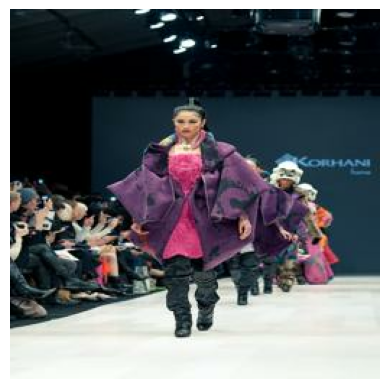

data_256/r/restaurant_kitchen/00004857.jpg 285


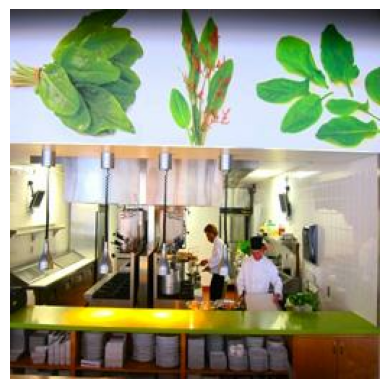

data_256/m/museum/indoor/00000693.jpg 236


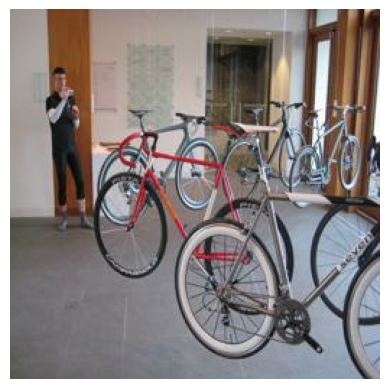

data_256/s/snowfield/00004248.jpg 309


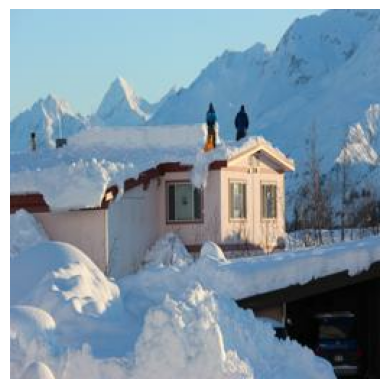

data_256/d/dining_room/00004835.jpg 121


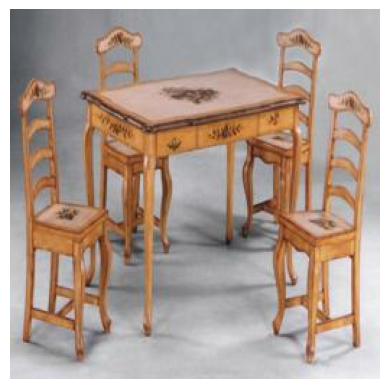

data_256/e/elevator_lobby/00002380.jpg 130


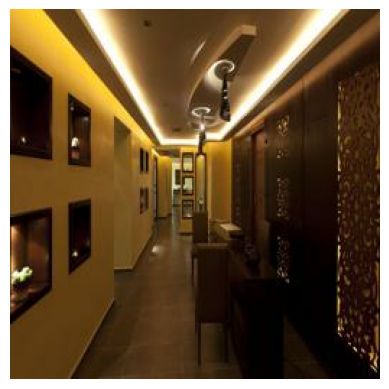

data_256/l/living_room/00004955.jpg 215


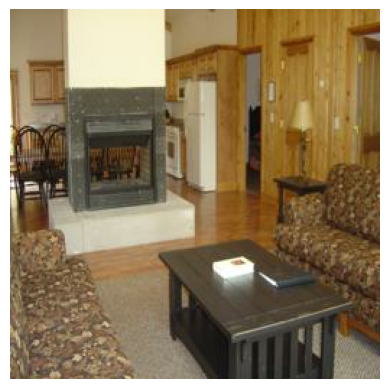

data_256/c/corral/00000085.jpg 105


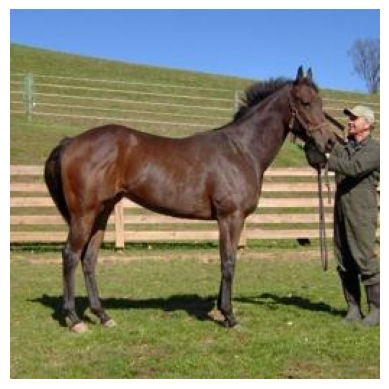

data_256/c/conference_room/00002902.jpg 102


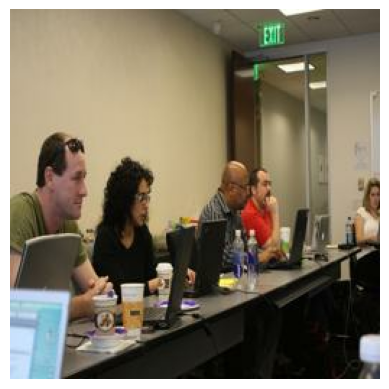

data_256/h/house/00000344.jpg 183


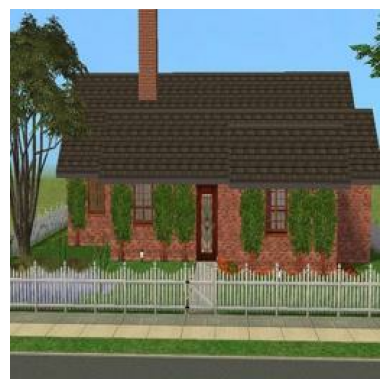

data_256/i/iceberg/00002931.jpg 190


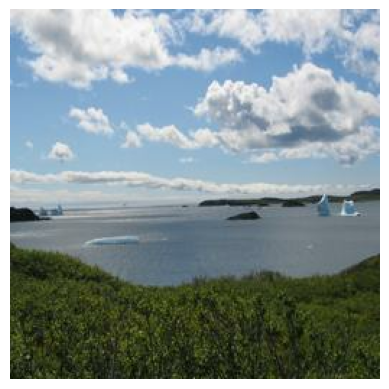

In [ ]:
ds_t = ds.take(50)

data_dict = {}
index = 0

scene_folder = "scene"
os.makedirs(scene_folder, exist_ok=True)

for image_detail in ds_t:

  # data for js
  label = int(image_detail["label"].numpy())
  origin_file_name = image_detail["filename"].numpy().decode('utf-8')
  image_file_name = f'scene_{index}.png'
  print(origin_file_name, label)

  # data for image file
  image = image_detail["image"]

  # save image to png file
  image_array = image.numpy()
  pil_image = Image.fromarray(image_array)
  pil_image.save(os.path.join(scene_folder, image_file_name))

  plt.imshow(image_array)
  plt.axis('off')  # Turn off axis labels and ticks
  plt.show()

  data_dict[image_file_name] = {"origin_file_name": origin_file_name, "label": label}
  index = index + 1

# Specify the path to the JSON file
json_file_path = os.path.join(scene_folder, "scene_image_data.js")

# Write the dictionary to the JSON file
with open(json_file_path, 'w') as json_file:
    json.dump(data_dict, json_file, indent=4)

# 1. Open the file in read mode
with open(json_file_path, 'r') as file:
    # 2. Read the existing content
    existing_content = file.read()

# 3. Open the file in write mode (this will overwrite the file)
with open(json_file_path, 'w') as file:
    # 4. Write the new string at the beginning
    new_string = "scene_image_data="
    file.write(new_string)

    # 5. Write the previously read content after the new string
    file.write(existing_content)

## Record label number and their corresponding category

In [ ]:
file_directory = os.path.join(root_dir, "places365_small/2.1.0/")
file_name = "label.labels.txt"
label_file = os.path.join(file_directory, file_name)

# Initialize an empty dictionary
label_dict = {}

# Open the file for reading
with open(label_file, 'r') as file:
    # Read each line and enumerate it to get line numbers
    for line_number, line in enumerate(file):
        # Strip any leading/trailing whitespace and add it to the dictionary
        label_dict[line_number] = line.strip()

# Specify the path to the JSON file
json_file_path = os.path.join(scene_folder, "scene_label_data.js")

# Write the dictionary to the JSON file
with open(json_file_path, 'w') as json_file:
    json.dump(label_dict, json_file, indent=4)

with open(json_file_path, 'r') as file:
    existing_content = file.read()

with open(json_file_path, 'w') as file:
    new_string = "scene_label_data="
    file.write(new_string)
    file.write(existing_content)

## Compress the scene folder to a zip file

In [ ]:
!zip -r "scene.zip" "scene"

  adding: scene/ (stored 0%)
  adding: scene/scene_31.png (deflated 0%)
  adding: scene/scene_3.png (deflated 1%)
  adding: scene/scene_11.png (deflated 0%)
  adding: scene/scene_41.png (deflated 0%)
  adding: scene/scene_17.png (deflated 0%)
  adding: scene/scene_13.png (deflated 1%)
  adding: scene/scene_22.png (deflated 0%)
  adding: scene/scene_23.png (deflated 0%)
  adding: scene/scene_24.png (deflated 0%)
  adding: scene/scene_14.png (deflated 0%)
  adding: scene/scene_45.png (deflated 0%)
  adding: scene/scene_33.png (deflated 0%)
  adding: scene/scene_42.png (deflated 0%)
  adding: scene/scene_27.png (deflated 0%)
  adding: scene/scene_38.png (deflated 0%)
  adding: scene/scene_4.png (deflated 0%)
  adding: scene/scene_1.png (deflated 0%)
  adding: scene/scene_48.png (deflated 0%)
  adding: scene/scene_44.png (deflated 0%)
  adding: scene/scene_28.png (deflated 1%)
  adding: scene/scene_12.png (deflated 1%)
  adding: scene/scene_9.png (deflated 0%)
  adding: scene/scene_5.png (

## Citation

If you're using `tensorflow-datasets` for a paper, please include the following citation, in addition to any citation specific to the used datasets (which can be found in the [dataset catalog](https://www.tensorflow.org/datasets/catalog/overview)).

```
@article{zhou2017places,
  title={Places: A 10 million Image Database for Scene Recognition},
  author={Zhou, Bolei and Lapedriza, Agata and Khosla, Aditya and Oliva, Aude and Torralba, Antonio},
  journal={IEEE Transactions on Pattern Analysis and Machine Intelligence},
  year={2017},
  publisher={IEEE}
}
```